# Ninjacart Business Case

## Introduction:

Ninjacart is India's largest fresh produce supply chain company. They are pioneers in solving one of the toughest supply chain problems of the world by leveraging innovative technology. They source fresh produce from farmers and deliver them to businesses within 12 hours.

## Problem statement:

An integral component of their automation process is the development of robust classifiers which can distinguish between images of different types of vegetables, while also correctly labeling images that do not contain any one type of vegetable as noise.

As a starting point, ninjacart has provided us with a dataset scraped from the web which contains train and test folders, each having 4 sub-folders with images of onions, potatoes, tomatoes and some market scenes. We have been tasked with preparing a multiclass classifier for identifying these vegetables.

Importing required libraries

In [51]:
import os
from pathlib import Path
import glob
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import warnings
warnings.filterwarnings('ignore')

Setting parameters

In [52]:
DATA_ROOT = Path("ninjacart_data")
TRAIN_DIR = DATA_ROOT / "train"
TEST_DIR = DATA_ROOT / "test"
IMAGE_SIZE = [256, 256]
BATCH_SIZE = 64
SEED = 2022

Loading the data

In [53]:
!gdown --fuzzy https://drive.google.com/file/d/1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT/view

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=53be2732-9e0c-469e-945f-8250c939c530
To: /content/ninjacart_data.zip
100% 275M/275M [00:03<00:00, 77.6MB/s]


In [54]:
import zipfile

with zipfile.ZipFile('/content/ninjacart_data.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/')

Vizualizing our data

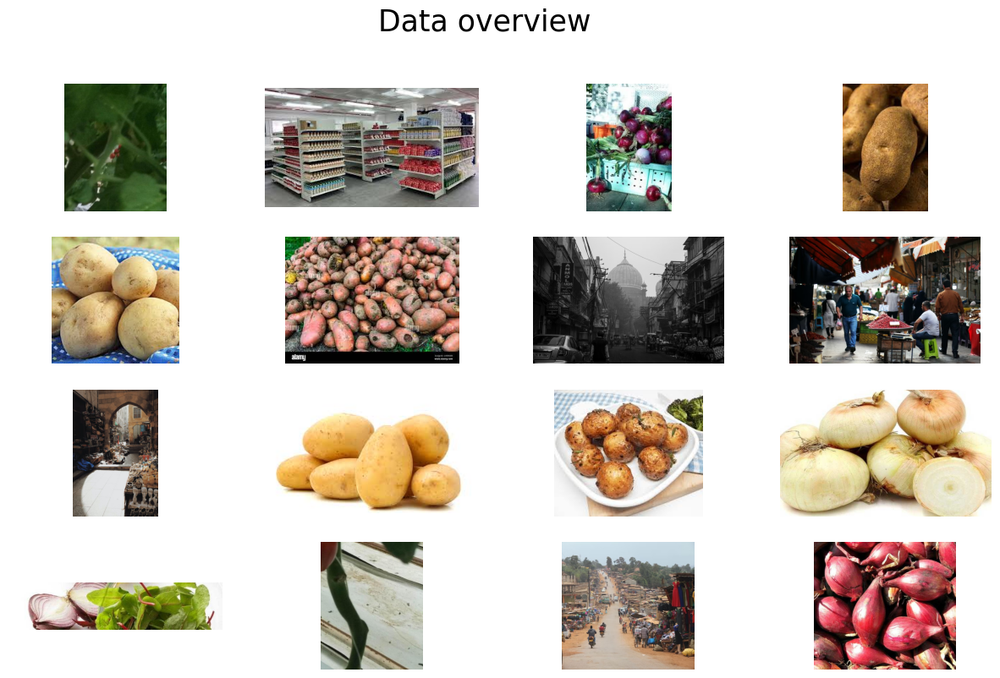

In [55]:
train_folder = 'ninjacart_data/train'

images = []

for folder in os.listdir(train_folder):
    for image in os.listdir(os.path.join(train_folder, folder)):
        images.append(os.path.join(train_folder, folder, image))

fig = plt.figure(1, figsize=(15, 9))
fig.suptitle('Data overview', fontsize=25)
plt.axis('off')
n = 0
for i in range(16):
  n += 1
  random_img = random.choice(images)
  imgs = tf.keras.utils.load_img(random_img)
  plt.subplot(4, 4, n)
  plt.axis('off')
  plt.imshow(imgs)

plt.show()

* We create a code snippet to retrieve the file paths of all images for each class in both the training and test sets located within the root folder. These paths will later be used to evaluate the model on randomly selected samples.

* We store the image arrays and the count of images per class in dictionaries to visualize the class distribution.


In [56]:
class_dirs = os.listdir("ninjacart_data/train") # list all directories inside "train" folder
image_dict = {} # dict to store image array(key) for every class(value)
count_dict = {} # dict to store count of files(key) for every class(value)

# iterate over all class_dirs
for cls in class_dirs:
    # get list of all paths inside the subdirectory
    file_paths = glob.glob(f'ninjacart_data/train/{cls}/*')
    # count number of files in each class and add it to count_dict
    count_dict[cls] = len(file_paths)
    # select random item from list of image paths
    image_path = random.choice(file_paths)
    # load image using keras utility function and save it in image_dict
    image_dict[cls] = tf.keras.utils.load_img(image_path)

## Store image arrays and count for each class in test data :

In [57]:
class_dirs_test = os.listdir("ninjacart_data/test") # list all directories inside "test" folder
image_dict_test = {} # dict to store image array(key) for every class(value)
count_dict_test = {} # dict to store count of files(key) for every class(value)

# iterate over all class_dirs
for cls in class_dirs_test:
    # get list of all paths inside the subdirectory
    file_paths_test = glob.glob(f'ninjacart_data/test/{cls}/*')
    # count number of files in each class and add it to count_dict
    count_dict_test[cls] = len(file_paths_test)
    # select random item from list of image paths
    image_path = random.choice(file_paths_test)
    # load image using keras utility function and save it in image_dict
    image_dict_test[cls] = tf.keras.utils.load_img(image_path)

# Image Dimentional Analysis

## Plotting grid of images with labels




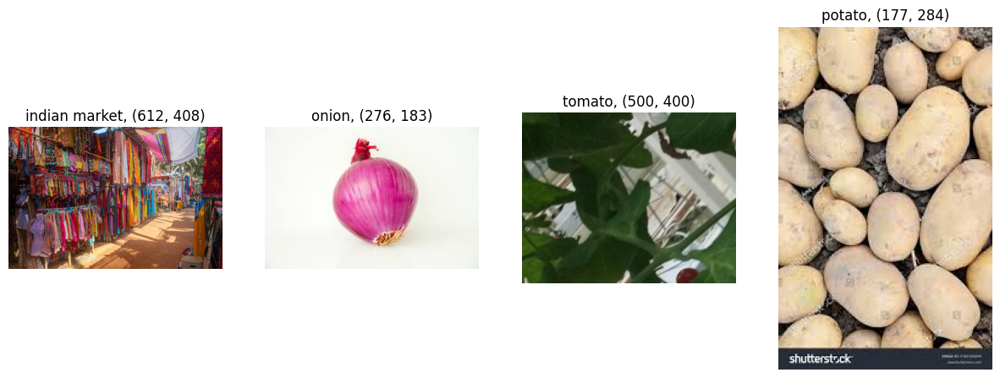

In [58]:
# Visualize Random Sample from each class

plt.figure(figsize=(15, 7))
# iterate over dictionary items (class label, image array)
for i, (cls,img) in enumerate(image_dict.items()):
    # create a subplot axis
    ax = plt.subplot(1, 4, i + 1)
    # plot each image
    plt.imshow(img)
    # set "class name" along with "image size" as title
    plt.title(f'{cls}, {img.size}')
    plt.axis("off")

* Analyze the dataset to observe that it contains images of varying sizes.
* Some images depict market scenes, which we will categorize under the class 'noise'.
* To prepare this data for training, we need to apply appropriate preprocessing steps.

# Distribution of Classes
* Let's visualize the number of samples per class to check for any class imbalance.
* We'll plot the class distribution using `image_dict` and `count_dict`, which store sample images and their corresponding counts for each class.
* Additionally, we'll convert `count_dict` into a DataFrame to display the number of images per class in both the training and test directories.


Count of training samples per class:
            class  count
0  indian market    599
1          onion    849
2         tomato    789
3         potato    898 



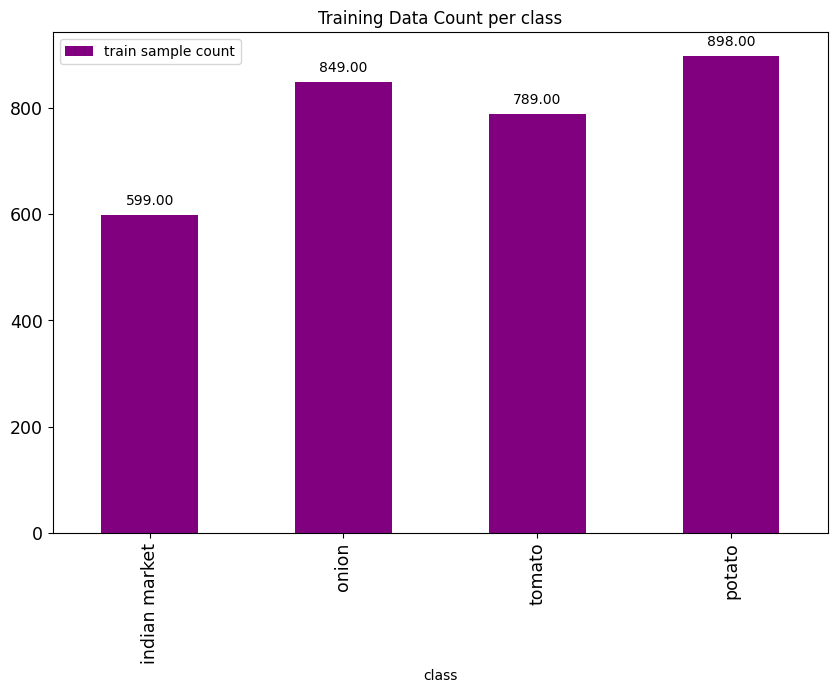

In [59]:
# Let's now Plot the Data Distribution of Training Data across Classes
df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})

print("Count of training samples per class:\n", df_count_train, "\n")

# draw a bar plot using pandas in-built plotting function
b = df_count_train.plot.bar(x='class', y='count', title="Training Data Count per class", label='train sample count', color='purple', figsize = (10, 6.5), fontsize=12.5)

# Annotate the bars in our plot with their values
for q in b.patches:
    b.annotate(f'{q.get_height():0.2f}', (q.get_x() + q.get_width() / 2., q.get_height()),
               ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

* From the above plot, we can see that while the data isn't perfectly balanced, the distribution across classes is reasonably even—so it's suitable for training.


Count of testing samples per class:
            class  count
0  indian market     81
1          onion     83
2         tomato    106
3         potato     81 



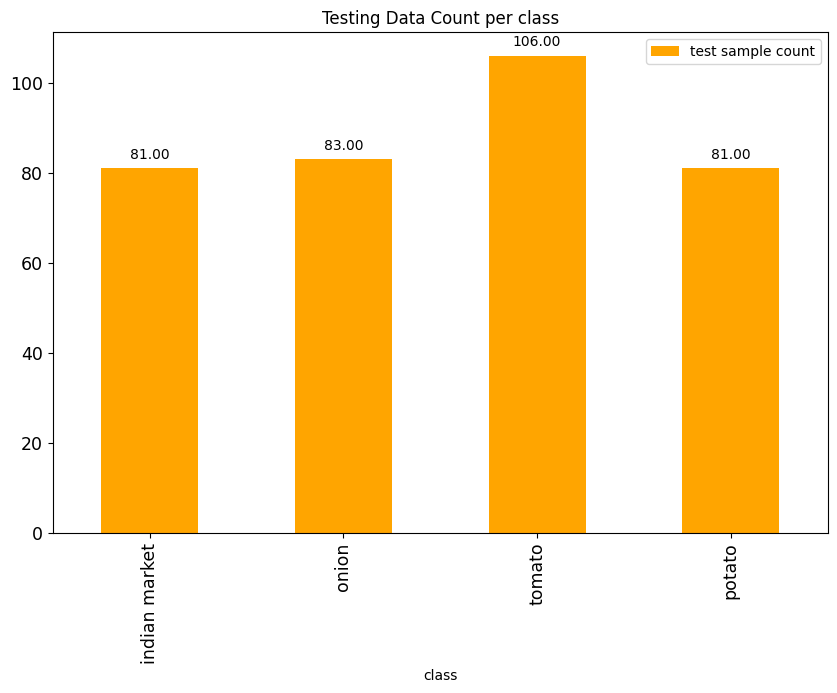

In [60]:
# Let's now Plot the Data Distribution of Training Data across Classes
df_count_test = pd.DataFrame({
    "class": count_dict_test.keys(),     # keys of count_dict are class labels
    "count": count_dict_test.values(),   # value of count_dict contain counts of each class
})

print("Count of testing samples per class:\n", df_count_test, "\n")

# draw a bar plot using pandas in-built plotting function
a = df_count_test.plot.bar(x='class', y='count', title="Testing Data Count per class", color='orange', label='test sample count', figsize =(10, 6.5), fontsize=12.5)
for p in a.patches:
    a.annotate(f'{p.get_height():0.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
               ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

In [61]:
train_dir = 'ninjacart_data/train'
test_dir = 'ninjacart_data/test'

In [62]:
# Specifying the image size to resize all images
image_size = (256, 256)

In [63]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR, seed=SEED, validation_split=0.2, subset='training',
    label_mode='categorical', image_size=IMAGE_SIZE, batch_size=BATCH_SIZE)

val_ds   = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR, seed=SEED, validation_split=0.2, subset='validation',
    label_mode='categorical', image_size=IMAGE_SIZE, batch_size=BATCH_SIZE)

test_ds  = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    label_mode='categorical', image_size=IMAGE_SIZE, batch_size=BATCH_SIZE,
    shuffle=False)            # keep order for the confusion matrix later

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Found 3135 files belonging to 4 classes.
Using 627 files for validation.
Found 351 files belonging to 4 classes.


Since labe_mode = 'Categorical' one hot encodes the classes Alphabetcally
Indian market(noise) = class 1 and tomato = class 4

In [64]:
class_names = train_ds.class_names
print(class_names)

['indian market', 'onion', 'potato', 'tomato']


In [65]:
def plot_acc_loss(model_history):

  fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
  ax = axes.ravel()

  n_epochs = len(model_history.history['loss'])

  #accuracy graph
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['acc']], label='Train', color='b')
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['val_acc']], label='Val', color='r')
  ax[0].set_title('Accuracy vs. epoch', fontsize=15)
  ax[0].set_ylabel('Accuracy', fontsize=15)
  ax[0].set_xlabel('epoch', fontsize=15)
  ax[0].legend()

  #loss graph
  ax[1].plot(range(0, n_epochs), model_history.history['loss'], label='Train', color='b')
  ax[1].plot(range(0, n_epochs), model_history.history['val_loss'], label='Val', color='r')
  ax[1].set_title('Loss vs. epoch', fontsize=15)
  ax[1].set_ylabel('Loss', fontsize=15)
  ax[1].set_xlabel('epoch', fontsize=15)
  ax[1].legend()

  #display the graph
  plt.show()

In [66]:
def classwise_accuracy(class_path, class_name, model_name) :
    paths = []
    for i in os.listdir(class_path):
        paths.append(class_path + "/" + str(i))

    correct = 0
    total = 0

    for i in range(len(paths)):
        total+= 1

        img = tf.keras.utils.load_img(paths[i])
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        if tf.argmax(pred[0]) == class_names.index(f"{class_name}"):
            correct+= 1

    print(f"Accuracy for class {class_name} is {round((correct/total)*100, 2)}% consisting of {len(paths)} images")

In [67]:
def conf_mat(class_path, pred_list, model_name) :
    noise, tomato, potato, onion = 0, 0, 0, 0
    for i in os.listdir(class_path):

        img = tf.keras.utils.load_img(class_path + "/" + str(i))
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        predicted = tf.argmax(pred, 1).numpy().item()

        if predicted == 0:
            noise+= 1
        elif predicted == 1:
            onion+= 1
        elif predicted == 2:
            potato+= 1
        else:
            tomato+= 1


    for item in noise, onion, potato, tomato :
        pred_list.append(item)

# Custom CNN Model

## Defining architecture of the model and Compiling the model

In [68]:
model = tf.keras.Sequential([

tf.keras.layers.Rescaling(1./255,  input_shape=(*IMAGE_SIZE, 3)),


tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),

tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),

tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),

tf.keras.layers.GlobalAveragePooling2D(),
tf.keras.layers.Dense(4, activation = 'softmax')
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)


model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 139,940 (546.64 KB)

 Trainable params: 139,940 (546.64 KB)

 Non-trainable params: 0 (0.00 B)

# Training the model

* Setting up a TensorBoard callback to log and visualize our model’s metrics during training, and save them to a specified log directory.

In [69]:
log_dir_1 = "logs/Custom_CNN_overfit"
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_1, histogram_freq=1)

In [70]:
history = model.fit(train_ds, epochs=20, validation_data=val_ds, callbacks=[tensorboard_cb])

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 22s 455ms/step - acc: 0.2896 - loss: 1.3710 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_acc: 0.3190 - val_loss: 1.3238 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 14s 342ms/step - acc: 0.4118 - loss: 1.2838 - precision: 0.1898 - recall: 3.1248e-04 - val_acc: 0.5662 - val_loss: 1.1160 - val_precision: 0.9412 - val_recall: 0.0255
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 20s 335ms/step - acc: 0.6113 - loss: 1.0240 - precision: 0.8853 - recall: 0.2060 - val_acc: 0.7177 - val_loss: 0.8304 - val_precision: 0.9017 - val_recall: 0.4242
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 14s 342ms/step - acc: 0.6940 - loss: 0.8120 - precision: 0.8501 - recall: 0.4855 - val_acc: 0.6475 - val_loss: 0.7917 - val_precision: 0.7450 - val_recall: 0.5359
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 341ms/step - acc: 0.6926 - loss: 0.7792 - precision: 0.7838 - recall: 0.5692 - val_acc: 0.7384 - val_loss: 0.6944 - val_precision: 0.8

# Plotting model performance

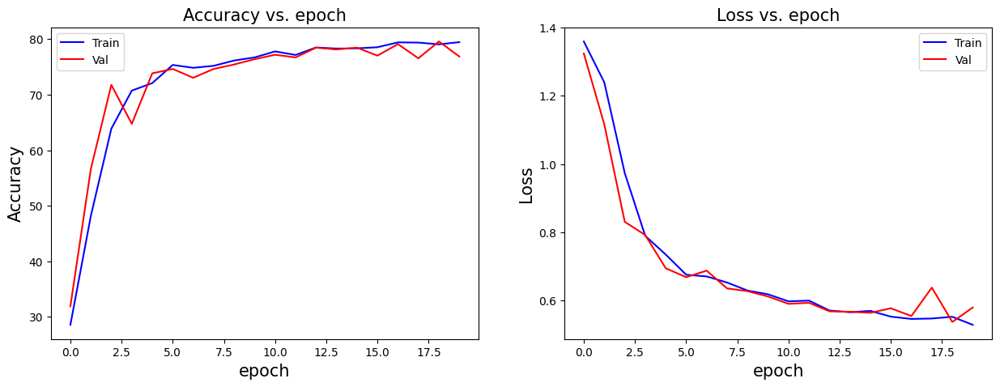

In [71]:
plot_acc_loss(history)

In [72]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 419,822 (1.60 MB)

 Trainable params: 139,940 (546.64 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 279,882 (1.07 MB)

# Model testing

We retrieve all files from the test directory and store their full paths in a list called *test\_images*. This list will later be used to evaluate our model by making predictions on randomly selected unseen data.

In [73]:
test_images = []

for folder in os.listdir(test_dir):
  for image in os.listdir(test_dir + '/' + folder):
    test_images.append(os.path.join(test_dir, folder, image))

# Random sample testing:

To evaluate our model on a random sample:

* Select a random image from the *test\_images* list, which contains the paths of all test images.
* Resize the selected image to **(256, 256)**.
* Expand its dimensions to include a batch dimension at the beginning.
* Use `model.predict()` to make a prediction on the processed image.


In [74]:
def grid_test_model(model_name):

  fig = plt.figure(1, figsize=(17, 11))
  plt.axis('off')
  n = 0
  for i in range(8):
    n += 1

    img_0 = tf.keras.utils.load_img(random.choice(test_images))
    img_0 = tf.keras.utils.img_to_array(img_0)
    img_0 = tf.image.resize(img_0, (256, 256))
    img_1 = tf.expand_dims(img_0, axis = 0)

    pred = model_name.predict(img_1)
    predicted_label = tf.argmax(pred, 1).numpy().item()

    for item in pred :
      item = tf.round((item*100))

    plt.subplot(2, 4, n)
    plt.axis('off')
    plt.title(f'prediction : {class_names[predicted_label]}\n\n'
              f'{item[0]} % {class_names[0]}\n'
              f'{item[1]} % {class_names[1]}\n'
              f'{item[2]} % {class_names[2]}\n'
              f'{item[3]} % {class_names[3]}\n')
    plt.imshow(img_0/255)
  plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 974ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


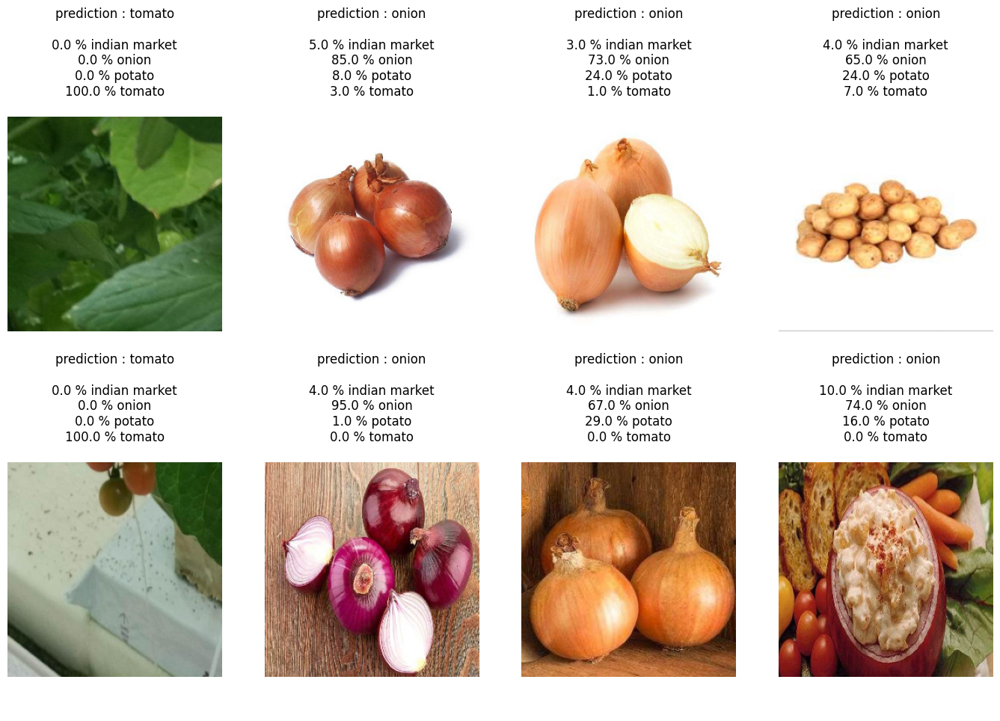

In [75]:
grid_test_model(model)

From the plot above, we can see that our model is **not very confident** in its predictions for the correct class. This indicates a need to improve or fine-tune the model to boost its confidence.

On a positive note, all our images are now consistently resized to **256x256**, ensuring uniform input dimensions.


### Evaluating accuracy of each class

We begin by specifying the paths for each test class.

* Then, we define a function called `classwise_accuracy` that computes the accuracy for a given class by taking the class path and the model as inputs.
* It gathers all image file paths for the specified class into a list.
* The function then makes predictions on each image and compares the predicted labels with the true class label.
* Based on these comparisons, it calculates the model’s accuracy for that specific class.

In [78]:
# Define class-wise paths
noise_path = os.path.join(train_folder, "indian market")
onion_path = os.path.join(train_folder, "onion")
potato_path = os.path.join(train_folder, "potato")
tomato_path = os.path.join(train_folder, "tomato")

In [79]:
classwise_accuracy(noise_path, 'indian market', model)
classwise_accuracy(onion_path, 'onion', model)
classwise_accuracy(potato_path, 'potato', model)
classwise_accuracy(tomato_path, 'tomato', model)

Accuracy for class indian market is 83.64% consisting of 599 images
Accuracy for class onion is 74.2% consisting of 849 images
Accuracy for class potato is 59.13% consisting of 898 images
Accuracy for class tomato is 97.47% consisting of 789 images


### Plotting the confusion matrix


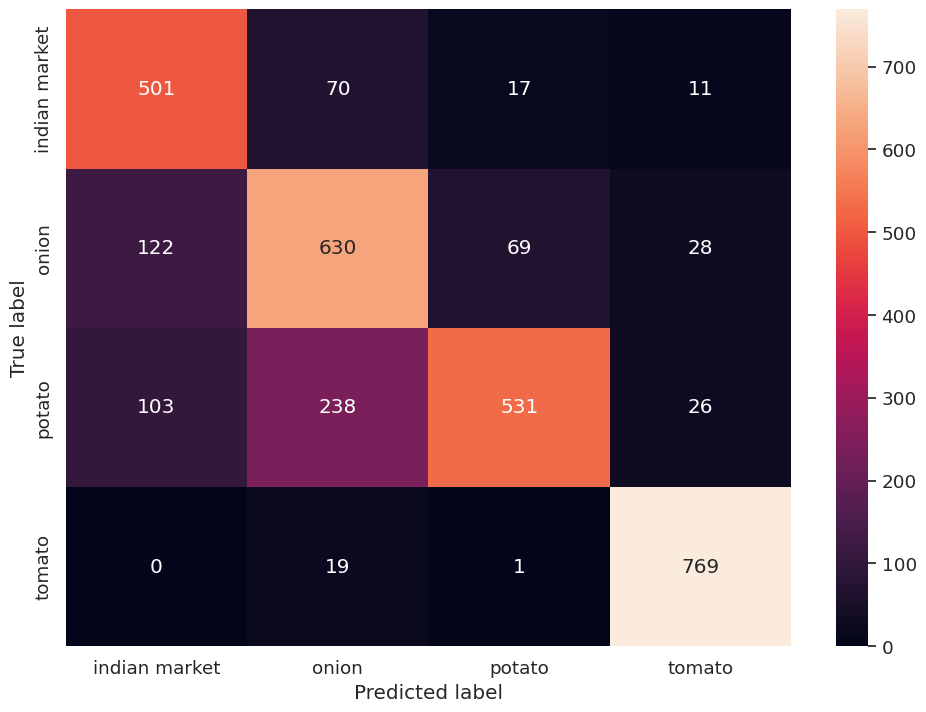

In [80]:
sns.set(rc={'figure.figsize':(11.7, 8.27)})
sns.set(font_scale=1.2)


noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model)
conf_mat(onion_path, l2, model)
conf_mat(potato_path, l3, model)
conf_mat(tomato_path, l4, model)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [81]:
result = model.evaluate(test_ds)
dict(zip(model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - acc: 0.7544 - loss: 0.6068 - precision: 0.7965 - recall: 0.6933


{'loss': 0.5614298582077026, 'compile_metrics': 0.7749287486076355}

* We observe that our baseline CNN model has a categorical cross-entropy loss of approximately 0.5,
* which suggests overfitting. Now, let’s explore some techniques to enhance our model’s performance!

# Model tuning - Solving overfitting problem

### Data Augmentation:

- Data Augmentation introduces our model to different aspects and visualizaitons of class images, therefore increasing model generalization
- We apply 3 types of augmentation on our training dataset
- Randomflip, Randomrotation and Randomtranslation.

In [82]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

# Adding Batch Normalization and Dropout

In [83]:
model_revamp = tf.keras.Sequential([

tf.keras.layers.Rescaling(1./255,  input_shape=(*IMAGE_SIZE, 3)),

tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),

tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),

tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.GlobalAveragePooling2D(),
tf.keras.layers.Dropout(rate = 0.2),

tf.keras.layers.Dense(4, activation = 'softmax')
])
model_revamp.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)


model_revamp.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 140,836 (550.14 KB)

 Trainable params: 140,388 (548.39 KB)

 Non-trainable params: 448 (1.75 KB)

# Implementing Callbacks

We define several callbacks to enhance our model training process:

* **TensorBoard**: Enables visualization of the model’s metrics during training, which we can review later.
* **ModelCheckpoint**: Saves the model’s weights at specified intervals, automatically keeping the best model based on the lowest validation loss (`val_loss`).
* **EarlyStopping**: Halts training when the monitored metric (`val_loss`) stops improving, after a patience period of 5 epochs (`patience=5`).

In [84]:
log_dir_2 = "logs/Custom_CNN_revamp"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir = log_dir_2, histogram_freq = 1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("CNN_best_augmented.keras", save_best_only = True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights = True
)

## Training our tuned model

In [85]:
history_0 = model_revamp.fit(
train_ds,
epochs=30,
validation_data = val_ds,
callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 51s 1s/step - acc: 0.6315 - loss: 0.9175 - precision: 0.7468 - recall: 0.4445 - val_acc: 0.2887 - val_loss: 1.3654 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - acc: 0.7866 - loss: 0.5902 - precision: 0.8294 - recall: 0.7180 - val_acc: 0.2887 - val_loss: 1.3751 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 999ms/step - acc: 0.8119 - loss: 0.5269 - precision: 0.8568 - recall: 0.7580 - val_acc: 0.2887 - val_loss: 1.3907 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - acc: 0.8041 - loss: 0.5069 - precision: 0.8585 - recall: 0.7486 - val_acc: 0.2887 - val_loss: 1.3664 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - acc: 0.8205 - loss: 0.4813 - precision: 0.8584 - recall: 0.7678 - val_acc: 0.2887 - val_loss: 1.3625 - val_precision: 0.5

In [86]:
result = model_revamp.evaluate(test_ds)
dict(zip(model_revamp.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - acc: 0.6771 - loss: 0.6819 - precision: 0.6997 - recall: 0.6072


{'loss': 0.49930766224861145, 'compile_metrics': 0.7720797657966614}

In [87]:
classwise_accuracy(noise_path, 'indian market', model_revamp)
classwise_accuracy(onion_path, 'onion', model_revamp)
classwise_accuracy(potato_path, 'potato', model_revamp)
classwise_accuracy(tomato_path, 'tomato', model_revamp)

Accuracy for class indian market is 70.78% consisting of 599 images
Accuracy for class onion is 74.44% consisting of 849 images
Accuracy for class potato is 93.88% consisting of 898 images
Accuracy for class tomato is 99.11% consisting of 789 images


Here we observe a steep increase in class accuracy after


- Applying augmentation to our data
- Adding Dropout and BatchNormalization
- Implementing callbacks during training

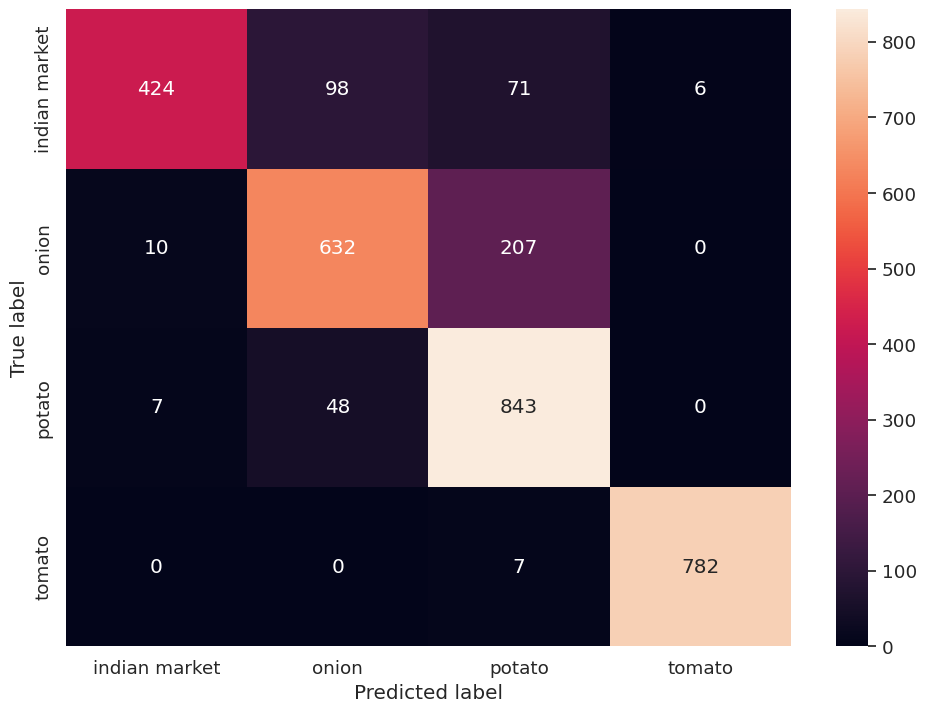

In [88]:
sns.set(rc={'figure.figsize':(11.7, 8.27)})
sns.set(font_scale=1.2)


noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []


conf_mat(noise_path, l1, model_revamp)
conf_mat(onion_path, l2, model_revamp)
conf_mat(potato_path, l3, model_revamp)
conf_mat(tomato_path, l4, model_revamp)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

From the confusion matrix displayed above, we can see that:

* The model generally distinguishes between all classes with very few errors.
* The classes *potato* and *onion* are the most frequently confused by the model.
* *Tomato* is the easiest class for the model to identify, exhibiting the least errors.


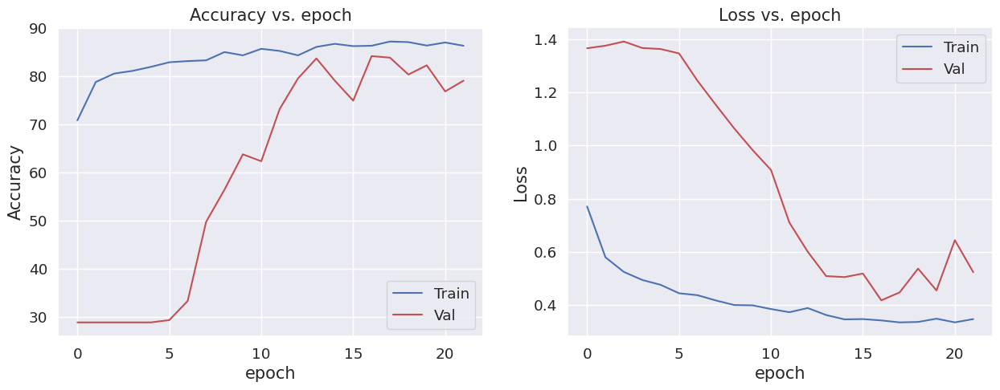

In [89]:
plot_acc_loss(history_0)

### Leveraging Transfer Learning:

* After addressing the overfitting issue in our baseline model,
* We’ll now explore and implement state-of-the-art model architectures known for their high accuracy and precision.
* Specifically, we’ll train three of the most efficient and accurate pretrained models from the ImageNet dataset.


The Models we will use :
- VGG-19
- ResNet
- MobileNet

# VGG - 19

In [90]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [95]:
# load base model
base_model_3 = tf.keras.applications.vgg19.VGG19(input_shape=(256, 256, 3), include_top = False)

# append classification layer
model_3 = base_model_3.output

model_3 = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255,  input_shape=(*IMAGE_SIZE, 3)),
            base_model_3,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

In [96]:
model_3.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)


model_3.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_4 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg19 (Functional)              │ (None, 8, 8, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,026,436 (76.39 MB)

 Trainable params: 20,026,436 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

In [97]:
log_dir_5 = "logs/VGG19"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_5, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("VGG19.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [98]:
history_3 = model_3.fit(train_ds, validation_data = val_ds, epochs = 20, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 310s 5s/step - acc: 0.5058 - loss: 1.0942 - precision: 0.5990 - recall: 0.3061 - val_acc: 0.7416 - val_loss: 0.6136 - val_precision: 0.7964 - val_recall: 0.6986
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 128s 3s/step - acc: 0.7758 - loss: 0.5055 - precision: 0.8193 - recall: 0.7428 - val_acc: 0.8660 - val_loss: 0.4942 - val_precision: 0.8780 - val_recall: 0.8612
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 112s 3s/step - acc: 0.8645 - loss: 0.3636 - precision: 0.8768 - recall: 0.8441 - val_acc: 0.9091 - val_loss: 0.3626 - val_precision: 0.9163 - val_recall: 0.9075
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 131s 3s/step - acc: 0.8928 - loss: 0.2841 - precision: 0.9079 - recall: 0.8843 - val_acc: 0.8612 - val_loss: 0.4659 - val_precision: 0.8645 - val_recall: 0.8549
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 140s 3s/step - acc: 0.9103 - loss: 0.2464 - precision: 0.9172 - recall: 0.8986 - val_acc: 0.9043 - val_loss: 0.3188 - val_precision: 0.9098 - val_recall: 0.9011
Epoch

# Evaluating VGG - 19

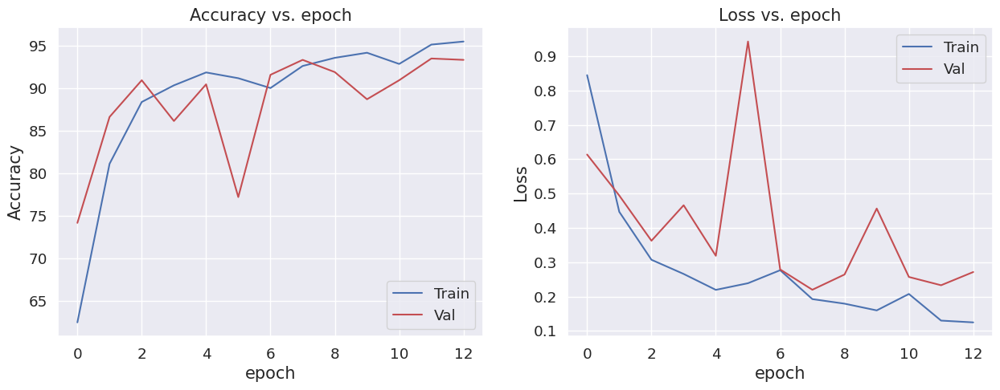

In [99]:
plot_acc_loss(history_3)

In [100]:
classwise_accuracy(noise_path, 'indian market', model_3)
classwise_accuracy(onion_path, 'onion', model_3)
classwise_accuracy(potato_path, 'potato', model_3)
classwise_accuracy(tomato_path, 'tomato', model_3)

Accuracy for class indian market is 97.66% consisting of 599 images
Accuracy for class onion is 93.4% consisting of 849 images
Accuracy for class potato is 93.32% consisting of 898 images
Accuracy for class tomato is 99.62% consisting of 789 images


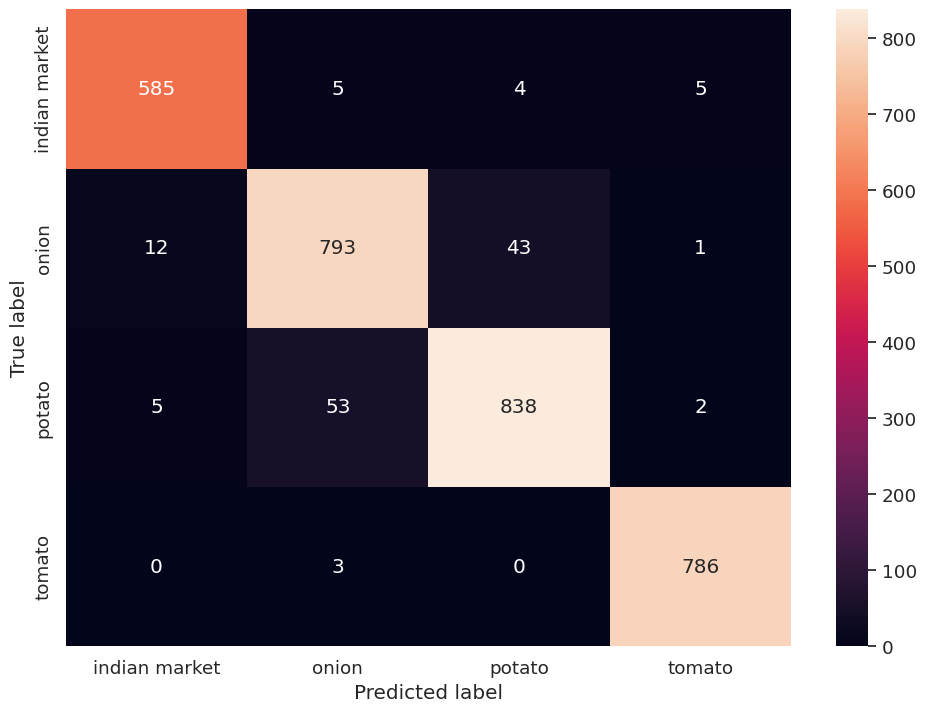

In [101]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_3)
conf_mat(onion_path, l2, model_3)
conf_mat(potato_path, l3, model_3)
conf_mat(tomato_path, l4, model_3)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [102]:
result = model_3.evaluate(test_ds)
dict(zip(model_3.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 22s 4s/step - acc: 0.8961 - loss: 0.3965 - precision: 0.8977 - recall: 0.8961


{'loss': 0.31071868538856506, 'compile_metrics': 0.9059829115867615}

# ResNet model

In [103]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [104]:
# load base model
base_model_1 = tf.keras.applications.resnet50.ResNet50(input_shape=(256, 256, 3), include_top = False)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [105]:
model_1 = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255, input_shape=(*IMAGE_SIZE, 3)),
            base_model_1,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

In [106]:
model_1.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)
model_1.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_5 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 8, 8, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │         8,196 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,595,908 (90.01 MB)

 Trainable params: 23,542,788 (89.81 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [107]:
log_dir_3 = "logs/ResNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_3, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("ResNet.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [108]:
history_1 = model_1.fit(train_ds, validation_data = val_ds, epochs = 20, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 242s 4s/step - acc: 0.7686 - loss: 0.5966 - precision: 0.8385 - recall: 0.6882 - val_acc: 0.2121 - val_loss: 3.4029 - val_precision: 0.2121 - val_recall: 0.2121
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 117s 3s/step - acc: 0.9576 - loss: 0.1189 - precision: 0.9603 - recall: 0.9528 - val_acc: 0.2121 - val_loss: 3.5665 - val_precision: 0.2121 - val_recall: 0.2121
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 120s 3s/step - acc: 0.9712 - loss: 0.0952 - precision: 0.9721 - recall: 0.9674 - val_acc: 0.2121 - val_loss: 3.6517 - val_precision: 0.2121 - val_recall: 0.2121
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 124s 3s/step - acc: 0.9792 - loss: 0.0608 - precision: 0.9825 - recall: 0.9780 - val_acc: 0.3126 - val_loss: 2.5852 - val_precision: 0.3098 - val_recall: 0.2663
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 116s 3s/step - acc: 0.9766 - loss: 0.0647 - precision: 0.9779 - recall: 0.9765 - val_acc: 0.2887 - val_loss: 20.0223 - val_precision: 0.2887 - val_recall: 0.2887
Epoc

# Evaluating ResNet

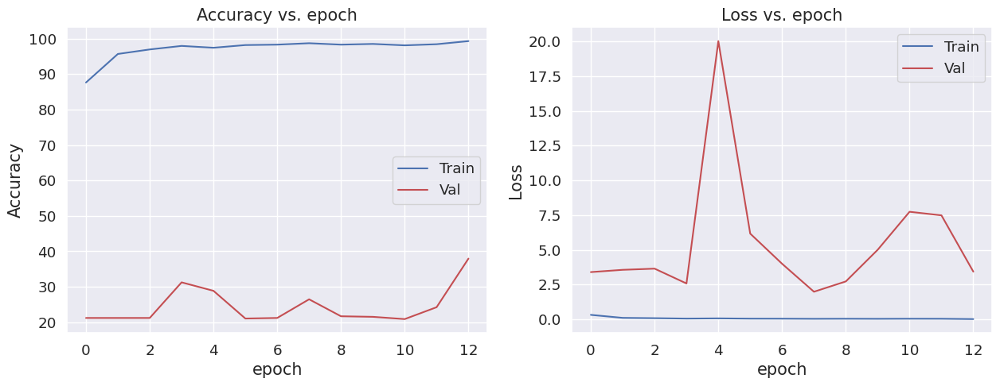

In [109]:
plot_acc_loss(history_1)

In [110]:
classwise_accuracy(noise_path, 'indian market', model_1)
classwise_accuracy(onion_path, 'onion', model_1)
classwise_accuracy(potato_path, 'potato', model_1)
classwise_accuracy(tomato_path, 'tomato', model_1)

Accuracy for class indian market is 81.3% consisting of 599 images
Accuracy for class onion is 34.39% consisting of 849 images
Accuracy for class potato is 1.45% consisting of 898 images
Accuracy for class tomato is 0.0% consisting of 789 images


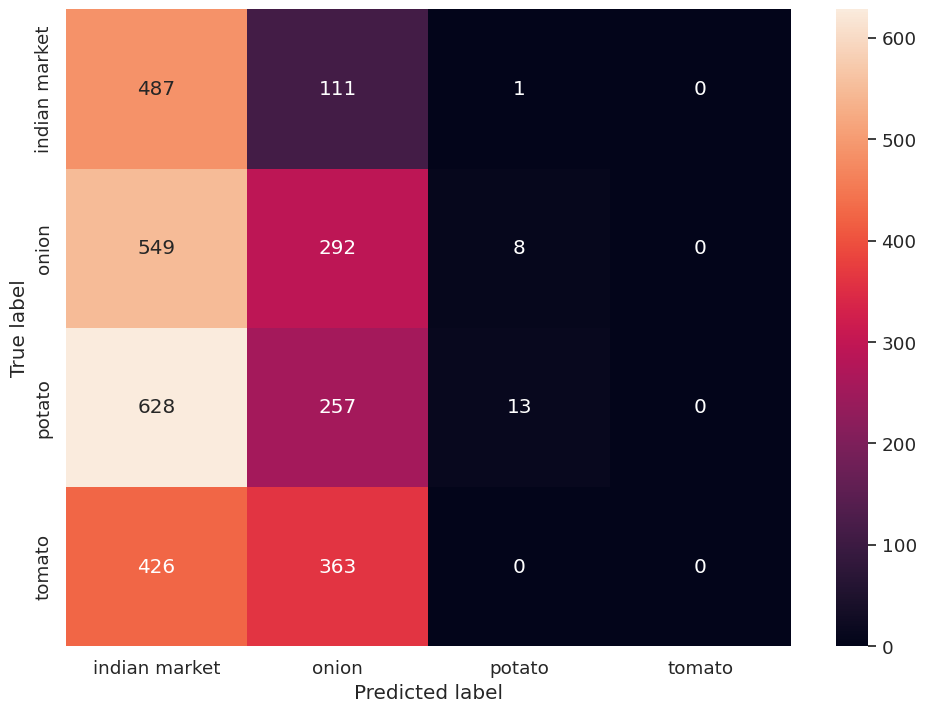

In [111]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_1)
conf_mat(onion_path, l2, model_1)
conf_mat(potato_path, l3, model_1)
conf_mat(tomato_path, l4, model_1)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [112]:
result = model_1.evaluate(test_ds)
dict(zip(model_1.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - acc: 0.5006 - loss: 1.4062 - precision: 0.5144 - recall: 0.3243


{'loss': 2.0078160762786865, 'compile_metrics': 0.31339031457901}

# MobileNet Model

In [113]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [114]:
# load base model
base_model_2 = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top = False)

# append classification layer
model_2 = base_model_2.output

model_2 = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255, input_shape=(*IMAGE_SIZE, 3)),
            base_model_2,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [115]:
log_dir_4 = "logs/MobileNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_4, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("MobileNet.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [116]:
model_2.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)

In [117]:
history_2 = model_2.fit(train_ds, validation_data = val_ds, epochs = 20, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - acc: 0.6586 - loss: 0.8740 - precision: 0.7138 - recall: 0.5912 - val_acc: 0.6571 - val_loss: 1.0448 - val_precision: 0.6661 - val_recall: 0.6491
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - acc: 0.9006 - loss: 0.2494 - precision: 0.9120 - recall: 0.8887 - val_acc: 0.7831 - val_loss: 0.6393 - val_precision: 0.7929 - val_recall: 0.7815
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 141s 3s/step - acc: 0.9318 - loss: 0.1870 - precision: 0.9421 - recall: 0.9271 - val_acc: 0.8437 - val_loss: 0.4385 - val_precision: 0.8473 - val_recall: 0.8405
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 138s 3s/step - acc: 0.9463 - loss: 0.1398 - precision: 0.9536 - recall: 0.9423 - val_acc: 0.8995 - val_loss: 0.3081 - val_precision: 0.9024 - val_recall: 0.8995
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 140s 3s/step - acc: 0.9609 - loss: 0.1271 - precision: 0.9648 - recall: 0.9506 - val_acc: 0.9506 - val_loss: 0.1576 - val_precision: 0.9535 - val_recall: 0.9474
Epoch

In [118]:
model_2.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_6 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 8, 8, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_6      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,655,118 (36.83 MB)

 Trainable params: 3,211,076 (12.25 MB)

 Non-trainable params: 21,888 (85.50 KB)

 Optimizer params: 6,422,154 (24.50 MB)

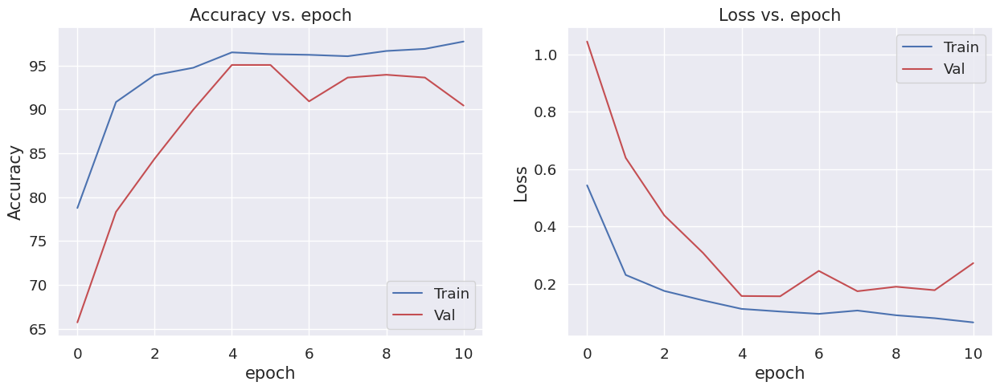

In [119]:
plot_acc_loss(history_2)

In [121]:
classwise_accuracy(noise_path, 'indian market', model_2)
classwise_accuracy(onion_path, 'onion', model_2)
classwise_accuracy(potato_path, 'potato', model_2)
classwise_accuracy(tomato_path, 'tomato', model_2)

Accuracy for class indian market is 97.5% consisting of 599 images
Accuracy for class onion is 94.23% consisting of 849 images
Accuracy for class potato is 97.44% consisting of 898 images
Accuracy for class tomato is 96.83% consisting of 789 images


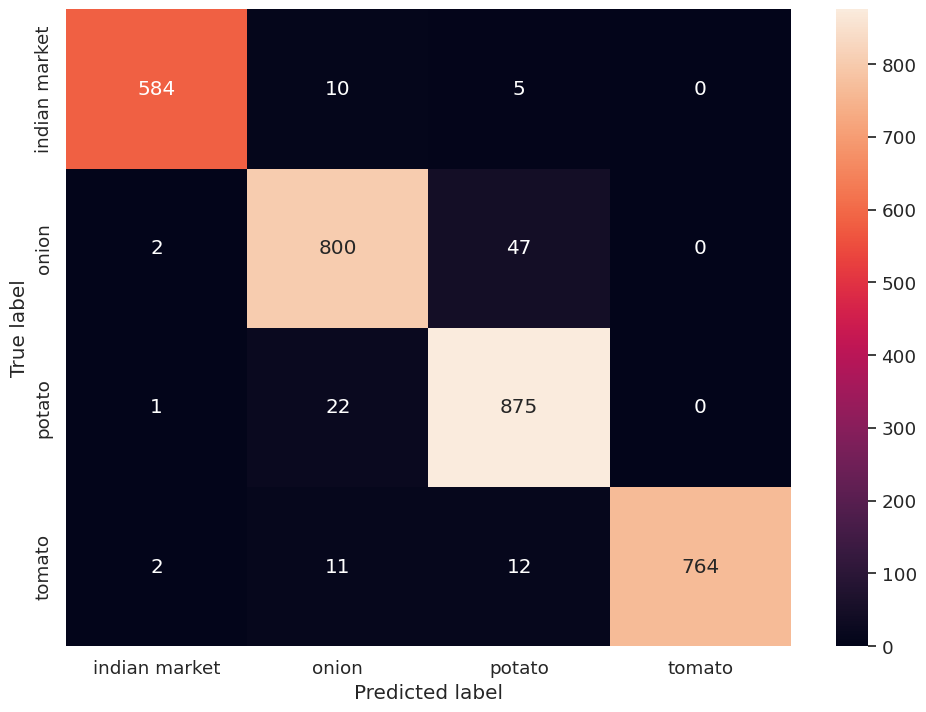

In [122]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_2)
conf_mat(onion_path, l2, model_2)
conf_mat(potato_path, l3, model_2)
conf_mat(tomato_path, l4, model_2)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [123]:
result = model_2.evaluate(test_ds)
dict(zip(model_2.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 997ms/step - acc: 0.8811 - loss: 0.4274 - precision: 0.8802 - recall: 0.8752


{'loss': 0.30996009707450867, 'compile_metrics': 0.9145299196243286}

# Comparision of models

##Summary of Trained models:


| Model | Test Acc| Train Acc
| --- | --- | ---|
| Custom CNN | 75% | 81% |
| CNN Revamp |  67%| 89% |
| VGG19 | 90% | 95% |
| ResNet50 | 50% | 99% |
| MobileNet | 88% | 97% |

* After training all our models, we identified **VGG19** as the most accurate on our dataset.
* Next, we'll use **TensorBoard** to visualize and compare the performance of each model using the training logs.
* From these visualizations, we observed that **VGG19 achieved the highest test accuracy**, while our **baseline CNN model had the lowest**.


In [124]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# **Best model (VGG-19)**

VGG19 achieved the highest accuracy of **90%** among all the models we trained

Let's test our Finetuned VGG-19 to predict on some random unseen data to visualize how accurate it is

In [125]:
model_3.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_4 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg19 (Functional)              │ (None, 8, 8, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 60,079,310 (229.18 MB)

 Trainable params: 20,026,436 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 40,052,874 (152.79 MB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


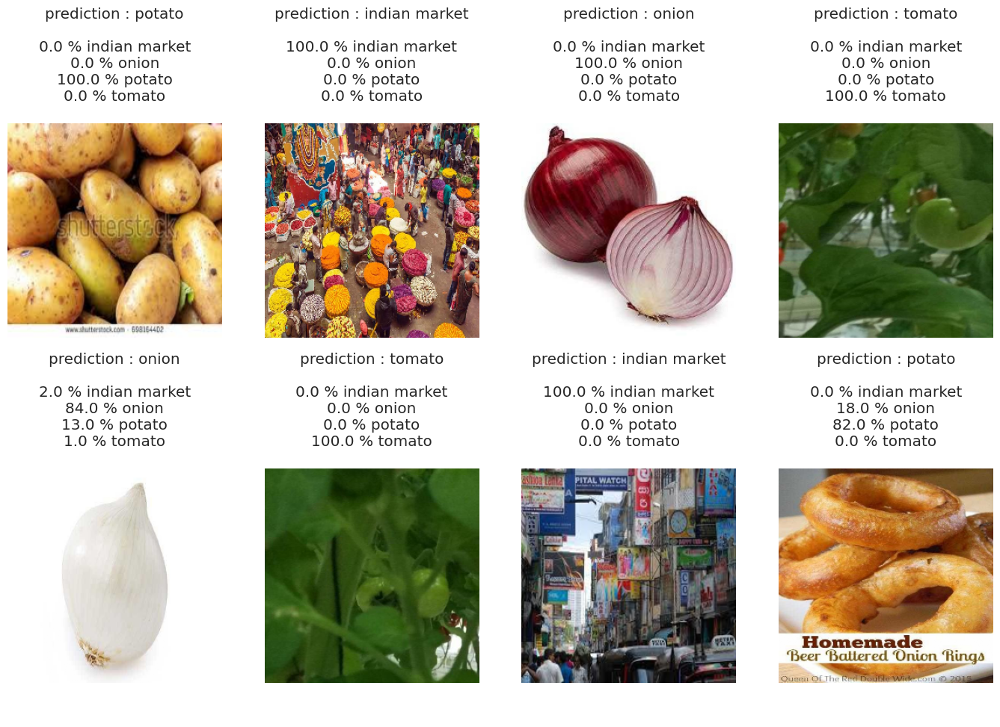

In [126]:
grid_test_model(model_3)

# Summary & insights:

* We got VGG-19 Net as a best model to identify and differentiate onion, tomato, potato and Indian market accurately compared to other models like Custom CNN, CNN Revamp, ResNet and MobileNet.

* Using this model Ninjacart can tackle to time constraint during supply of Vegetables.

* Eventualy it will decrease the time during supply and generate better sales over the period.